In [32]:
# Import the required libraries and dependencies
import pandas as pd
import geopandas as gpd
import hvplot.pandas
from pathlib import Path
import matplotlib.pyplot as plt
import plotly.express as px
import osmnx as os

In [33]:
countries = gpd.read_file("/Users/cynthiadavis/Downloads/countries.geojson")
countries["Country"] = countries["ADMIN"]

In [34]:
# Using the read_csv function and Path module, create a DataFrame 
wheat_exports = pd.read_csv(
    Path('./Wheat_Exports.csv'))
wheat_exports

,Country,USD_value_wheat_billion,pct_global_wheat_exports
0,Russia,7.30,13.10%
1,United States,7.29,13.10%
2,Australia,7.20,13%
3,Canada,6.60,11.90%
4,Ukraine,4.70,8.50%
5,France,4.60,8.20%
6,Argentina,3.00,5.30%
7,Germany,2.00,3.60%
8,Romania,1.80,3.30%
9,India,1.70,3.10%


In [35]:
wheat_imports = pd.read_csv(
    Path('./Wheat_Imports.csv'))
wheat_imports

,Rank,Country,Imports (1000 MT)
0,1,Indonesia,"11,200"
1,2,Egypt,"11,000"
2,3,Turkey,"10,000"
3,4,China,"9,500"
4,5,Algeria,"7,900"
...,...,...,...
120,121,Bhutan,10
121,122,Serbia,10
122,123,Uruguay,10
123,124,Paraguay,5


In [36]:
#wheat imports join
countries_w_wheat_imports = pd.merge(countries, wheat_imports, on='Country')
countries_w_wheat_imports.head()

,ADMIN,ISO_A3,geometry,Country,Rank,Imports (1000 MT)
0,Afghanistan,AFG,"POLYGON ((71.04980 38.40866, 71.05714 38.40903...",Afghanistan,20,"3,400"
1,Angola,AGO,"MULTIPOLYGON (((11.73752 -16.69258, 11.73851 -...",Angola,50,"1,000"
2,Albania,ALB,"POLYGON ((19.74777 42.57890, 19.74601 42.57993...",Albania,89,300
3,United Arab Emirates,ARE,"MULTIPOLYGON (((53.86305 24.23469, 53.88860 24...",United Arab Emirates,32,"1,800"
4,Argentina,ARG,"MULTIPOLYGON (((-68.65412 -54.88624, -68.65414...",Argentina,125,5


In [37]:
#wheat exports join
countries_w_wheat_exports = pd.merge(countries, wheat_exports, on='Country')
countries_w_wheat_exports.head()

,ADMIN,ISO_A3,geometry,Country,USD_value_wheat_billion,pct_global_wheat_exports
0,Argentina,ARG,"MULTIPOLYGON (((-68.65412 -54.88624, -68.65414...",Argentina,3.0,5.30%
1,Australia,AUS,"MULTIPOLYGON (((158.86573 -54.74993, 158.83823...",Australia,7.2,13%
2,Bulgaria,BGR,"POLYGON ((22.91956 43.83422, 23.05255 43.84282...",Bulgaria,1.4,2.50%
3,Canada,CAN,"MULTIPOLYGON (((-65.61059 43.42817, -65.62881 ...",Canada,6.6,11.90%
4,Germany,DEU,"MULTIPOLYGON (((6.74220 53.57836, 6.74952 53.5...",Germany,2.0,3.60%


## Wheat Imports Visualization

In [30]:
countries_w_wheat_imports.hvplot(c="Imports (1000 MT)", cmap="Oranges", hover_cols=["Country"], legend=False)

:Polygons   [x,y]   (Imports (1000 MT),Country)

In [26]:
countries_w_wheat_imports.hvplot?

<AxesSubplot:>

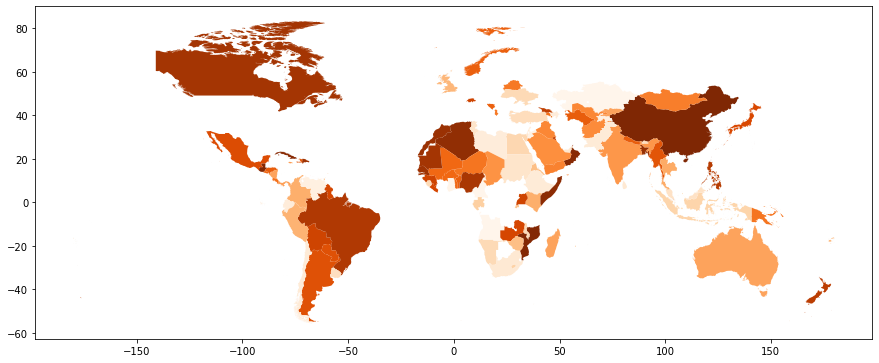

In [31]:
countries_w_wheat_imports.plot(column="Imports (1000 MT)", cmap="Oranges", figsize=(15,15), legend=False, k=5)

## Wheat Exports Visualization

In [38]:
countries_w_wheat_exports.hvplot(c="USD_value_wheat_billion", cmap="Oranges", hover_cols=["Country"], legend=False)

:Polygons   [x,y]   (USD_value_wheat_billion,Country)